# Figure 2

In [1]:
import scanpy as sc 
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib as mpl

## Settings

In [2]:
TEXT_WIDTH = 6.7261  # in
DPI = 350

In [3]:
def set_font_size(font_size):
    plt.rc('font', size=font_size)          # controls default text sizes
    plt.rc('axes', titlesize=font_size)     # fontsize of the axes title
    plt.rc('axes', labelsize=font_size)     # fontsize of the x and y labels
    plt.rc('xtick', labelsize=font_size)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=font_size)    # fontsize of the tick labels
    plt.rc('legend', fontsize=font_size, title_fontsize=font_size)    # legend fontsize
    plt.rc('figure', titlesize=font_size)   # fontsize of the figure title

In [4]:
sb.set(context='paper', style='whitegrid')
plt.rc('grid', linewidth=0.3)
sb.set_palette('colorblind')
set_font_size(6)

## Load Adatas

In [5]:
path_rna = 'results/fig2_rna_d1.h5ad'
path_tcr = 'results/fig2_tcr_d1.h5ad'
path_dual = 'results/fig2_multimodal_d1.h5ad'

In [6]:
ad_rna = sc.read(path_rna)
ad_tcr = sc.read(path_tcr)
ad_dual = sc.read(path_dual)

## Colors

In [7]:
mapper = {'A1101_IVTDFSVIK_EBNA-3B_EBV_binder': 'IVTDFSVIK',
          'A0301_KLGGALQAK_IE-1_CMV_binder': 'KLGGALQAK',
          'A0201_GILGFVFTL_Flu-MP_Influenza_binder': 'GILGFVFTL',
          'A0201_ELAGIGILTV_MART-1_Cancer_binder': 'ELAGIGILTV', 
          'A1101_AVFDRKSDAK_EBNA-3B_EBV_binder': 'AVFDRKSDAK',
          'A0201_GLCTLVAML_BMLF1_EBV_binder': 'GLCTLVAML',
          'A0301_RLRAEAQVK_EMNA-3A_EBV_binder': 'RLRAEAQVK',
          'B0801_RAKFKQLL_BZLF1_EBV_binder': 'RAKFKQLL'}

color_palette = {'IVTDFSVIK': 'tab:green',
                 'KLGGALQAK': 'tab:red', 
                 'GILGFVFTL': 'tab:orange',
                 'ELAGIGILTV': 'tab:blue',
                 'AVFDRKSDAK': 'tab:pink',
                 'GLCTLVAML': 'tab:brown',
                 'RLRAEAQVK': 'tab:purple',
                 'RAKFKQLL': 'tab:olive'}

In [8]:
palette_clonotypes = {
    '-99': 'silver',
    '10': 'tab:blue',
    '30': 'tab:orange',
    '86': 'tab:green',
    '164': 'tab:red',
    '26': 'tab:purple',
    '202': 'tab:brown',
    '92': 'tab:pink',
    '52': 'tab:cyan',
    '1': 'tab:olive',
}

## Plot Figure

In [9]:
def plot_umap(adata, grouping, ax, legend=None):
    xy = adata.obsm['X_umap']
    colors = adata.obs[grouping].values
    
    palette = None
    if grouping != 'large_clonotype':
        palette = 'viridis'
    if grouping == 'binding_name':
        colors = [mapper[el] for el in list(colors)]
        palette = color_palette
    if grouping == 'large_clonotype':
        palette = palette_clonotypes
    
    plot = sb.scatterplot(x=xy[:, 0], y=xy[:, 1], ax=ax, hue=colors, s=1, palette=palette)
    ax.grid(False)
    sb.despine(ax=ax, left=True, bottom=True)
    ax.set_yticks([])
    ax.set_xticks([])
    
    if legend is not None:
        ax.legend(markerscale=0.5, fontsize='small')
    else:
        ax.legend([], [], frameon=False)


In [10]:
def plot_colorbar(adata, gene, ax):
    palette = 'viridis'
    colors = adata.obs[gene].values
    norm = plt.Normalize(colors.min(), colors.max())
    sm = plt.cm.ScalarMappable(cmap=palette, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, label=f'Log {gene}', cax=ax)
    ax.grid(False)
    sb.despine(ax=ax, left=True, bottom=True)

In [11]:
def plot_empty(ax):
    ax.axis('off')

In [12]:
def plot_umap_axis(ax):
    ax.arrow(x=-8, y=-6.8, dx=0, dy=4.8, width=0.2, color='black',
             head_width=0.6, head_length=0.8, length_includes_head=True, zorder=1) 
    ax.arrow(x=-8.1, y=-6.8, dx=4.8, dy=0, width=0.2, color='black', 
             head_width=0.7, head_length=0.6, length_includes_head=True, zorder=1) 
    ax.text(-8, -8.2, 'UMAP1', size='medium', weight='bold')
    ax.text(-9.5, -6.5, 'UMAP2', size='medium', weight='bold', rotation=90)

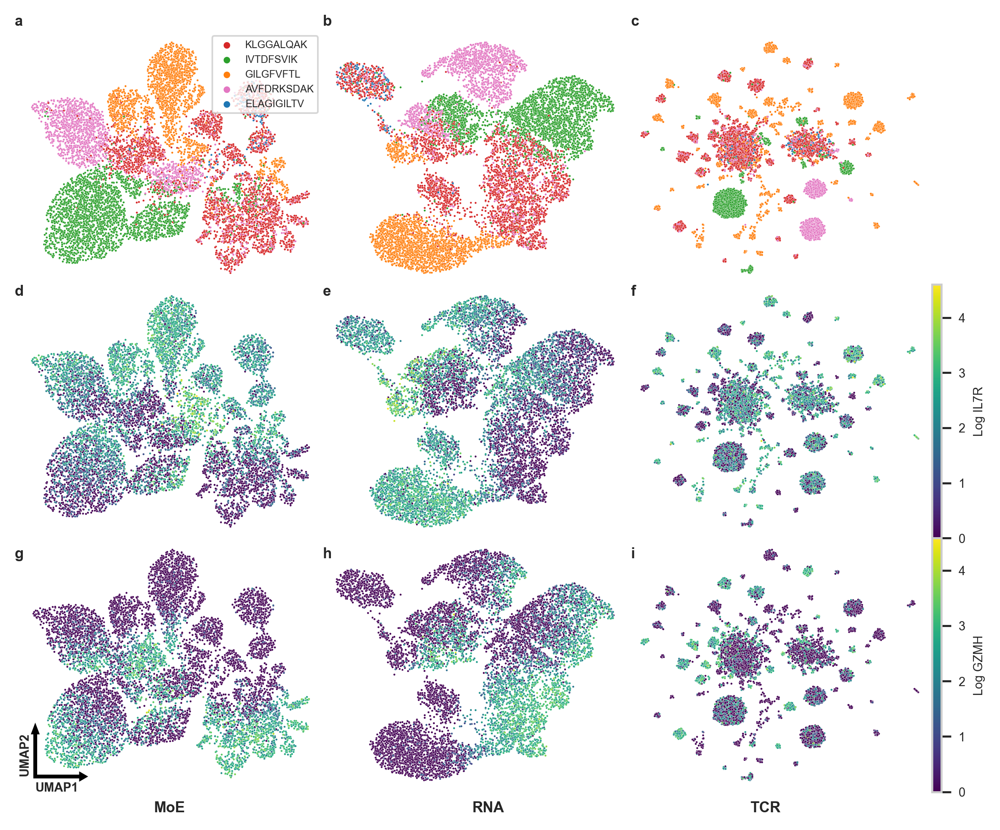

In [13]:
fig = plt.figure(figsize=(TEXT_WIDTH, TEXT_WIDTH * 0.8),
                 dpi=DPI)

gridspec = mpl.gridspec.GridSpec(
    figure=fig,
    nrows=3,
    ncols=4,
    height_ratios=[1, 1, 1],
    width_ratios=[1, 1, 1, 0.03],
    wspace=0.,
    hspace=0.,
)

ax_11 = fig.add_subplot(gridspec[0])
ax_12 = fig.add_subplot(gridspec[1])
ax_13 = fig.add_subplot(gridspec[2])
ax_14 = fig.add_subplot(gridspec[3])
ax_21 = fig.add_subplot(gridspec[4])
ax_22 = fig.add_subplot(gridspec[5])
ax_23 = fig.add_subplot(gridspec[6])
ax_24 = fig.add_subplot(gridspec[7])
ax_31 = fig.add_subplot(gridspec[8])
ax_32 = fig.add_subplot(gridspec[9])
ax_33 = fig.add_subplot(gridspec[10])
ax_34 = fig.add_subplot(gridspec[11])

plot_umap(ad_dual, 'binding_name', ax_11, legend=True)
plot_umap(ad_rna, 'binding_name', ax_12)
plot_umap(ad_tcr, 'binding_name', ax_13)
plot_empty(ax_14)

plot_umap(ad_dual, 'IL7R', ax_21)
plot_umap(ad_rna, 'IL7R', ax_22)
plot_umap(ad_tcr, 'IL7R', ax_23)
plot_colorbar(ad_dual, 'IL7R', ax_24)

plot_umap(ad_dual, 'GZMH', ax_31)
plot_umap(ad_rna, 'GZMH', ax_32)
plot_umap(ad_tcr, 'GZMH', ax_33)
plot_colorbar(ad_dual, 'GZMH', ax_34)

fig.text(0.01, 0.99, 'a', size='large', weight='bold')
fig.text(0.32, 0.99, 'b', size='large', weight='bold')
fig.text(0.63, 0.99, 'c', size='large', weight='bold')
fig.text(0.01, 0.65, 'd', size='large', weight='bold')
fig.text(0.32, 0.65, 'e', size='large', weight='bold')
fig.text(0.63, 0.65, 'f', size='large', weight='bold')
fig.text(0.01, 0.32, 'g', size='large', weight='bold')
fig.text(0.32, 0.32, 'h', size='large', weight='bold')
fig.text(0.63, 0.32, 'i', size='large', weight='bold')

fig.text(0.15, 0., 'MoE', size='large', weight='bold')
fig.text(0.47, 0., 'RNA', size='large', weight='bold')
fig.text(0.75, 0., 'TCR', size='large', weight='bold')

plot_umap_axis(ax_31)

fig.tight_layout()
fig.savefig('figures/02_10x_umaps.pdf',
           dpi=DPI, bbox_inches='tight')
fig.savefig('figures/02_10x_umaps.png',
           dpi=DPI, bbox_inches='tight')

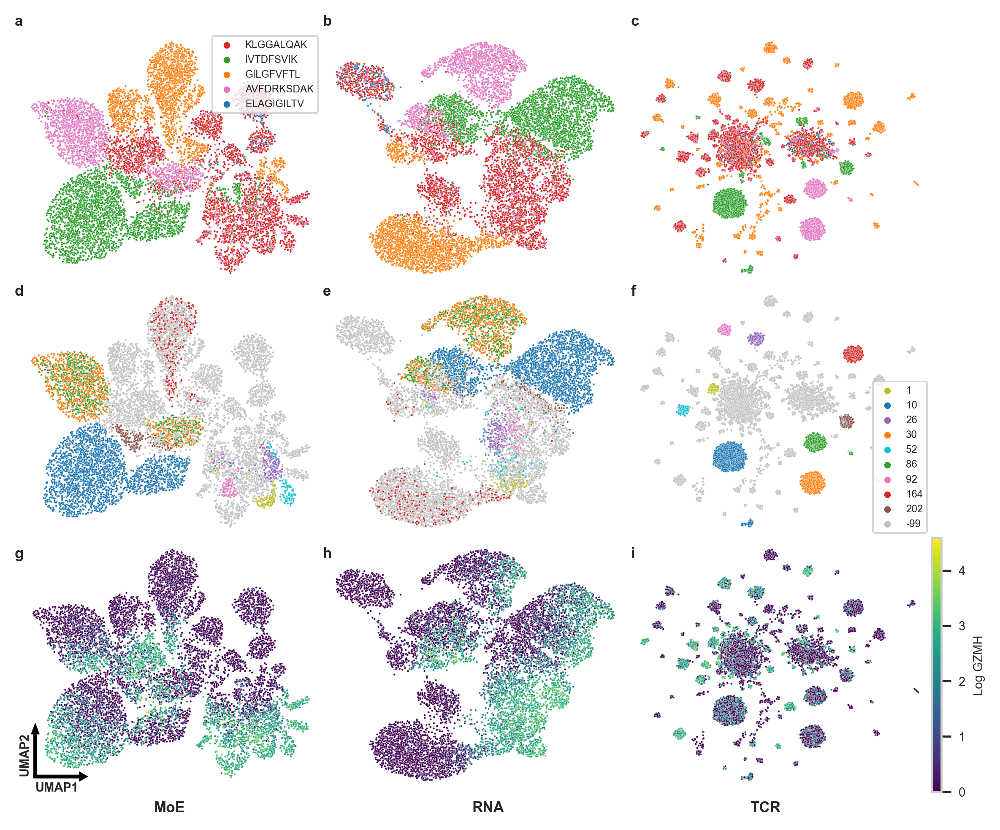

In [14]:
fig = plt.figure(figsize=(TEXT_WIDTH, TEXT_WIDTH * 0.8),
                 dpi=DPI)

gridspec = mpl.gridspec.GridSpec(
    figure=fig,
    nrows=3,
    ncols=4,
    height_ratios=[1, 1, 1],
    width_ratios=[1, 1, 1, 0.03],
    wspace=0.,
    hspace=0.,
)

ax_11 = fig.add_subplot(gridspec[0])
ax_12 = fig.add_subplot(gridspec[1])
ax_13 = fig.add_subplot(gridspec[2])
ax_14 = fig.add_subplot(gridspec[3])
ax_21 = fig.add_subplot(gridspec[4])
ax_22 = fig.add_subplot(gridspec[5])
ax_23 = fig.add_subplot(gridspec[6])
ax_24 = fig.add_subplot(gridspec[7])
ax_31 = fig.add_subplot(gridspec[8])
ax_32 = fig.add_subplot(gridspec[9])
ax_33 = fig.add_subplot(gridspec[10])
ax_34 = fig.add_subplot(gridspec[11])

plot_umap(ad_dual, 'binding_name', ax_11, legend=True)
plot_umap(ad_rna, 'binding_name', ax_12)
plot_umap(ad_tcr, 'binding_name', ax_13)
plot_empty(ax_14)

plot_umap(ad_dual, 'large_clonotype', ax_21)
plot_umap(ad_rna, 'large_clonotype', ax_22)
plot_umap(ad_tcr, 'large_clonotype', ax_23, legend=False)
#plot_colorbar(ad_dual, 'large_clonotypes', ax_24)
plot_empty(ax_24)

plot_umap(ad_dual, 'GZMH', ax_31)
plot_umap(ad_rna, 'GZMH', ax_32)
plot_umap(ad_tcr, 'GZMH', ax_33)
plot_colorbar(ad_dual, 'GZMH', ax_34)

fig.text(0.01, 0.99, 'a', size='large', weight='bold')
fig.text(0.32, 0.99, 'b', size='large', weight='bold')
fig.text(0.63, 0.99, 'c', size='large', weight='bold')
fig.text(0.01, 0.65, 'd', size='large', weight='bold')
fig.text(0.32, 0.65, 'e', size='large', weight='bold')
fig.text(0.63, 0.65, 'f', size='large', weight='bold')
fig.text(0.01, 0.32, 'g', size='large', weight='bold')
fig.text(0.32, 0.32, 'h', size='large', weight='bold')
fig.text(0.63, 0.32, 'i', size='large', weight='bold')

fig.text(0.15, 0., 'MoE', size='large', weight='bold')
fig.text(0.47, 0., 'RNA', size='large', weight='bold')
fig.text(0.75, 0., 'TCR', size='large', weight='bold')

plot_umap_axis(ax_31)

fig.tight_layout()
fig.savefig('figures/02_10x_umaps.pdf',
           dpi=DPI, bbox_inches='tight')
fig.savefig('figures/02_10x_umaps.png',
           dpi=DPI, bbox_inches='tight')

In [15]:
ad_rna.obs

,batch,binding_name,clonotype,IL7R,GZMH,large_clonotype,cd8_cytokines_score,cd8_coinhibition_score,cd8_differentiation_score,cd8_chemokines and sensing_score,cd8_transcription factors_score,trm_score
AAACGGGAGAAGATTC-1-donor_1,0,A0301_KLGGALQAK_IE-1_CMV_binder,0,0.000000,1.607361,-99,0.327454,-0.369148,-0.232436,0.222553,-0.567820,0.175978
AACTTTCAGTAACCCT-1-donor_1,0,A1101_IVTDFSVIK_EBNA-3B_EBV_binder,10,0.000000,0.000000,10,0.178044,0.208806,-0.637479,0.563653,-0.567820,-0.211192
ACACCCTAGGAGTTTA-1-donor_1,0,A0301_KLGGALQAK_IE-1_CMV_binder,14,3.634961,0.000000,-99,-1.232428,0.721119,1.365345,-0.281254,-0.567820,-0.211192
ACGAGGAGTCAATGTC-1-donor_1,0,A0201_GILGFVFTL_Flu-MP_Influenza_binder,23,2.788831,0.000000,-99,-0.518451,-0.369148,0.519645,-0.075791,-0.567820,-0.211192
ACGATACGTATATGGA-1-donor_1,0,A1101_IVTDFSVIK_EBNA-3B_EBV_binder,10,0.812391,2.775053,10,0.780371,0.665134,-0.205080,0.117916,-0.567820,1.339602
...,...,...,...,...,...,...,...,...,...,...,...,...
TGGGCGTTCACCATAG-40-donor_1,18,A1101_IVTDFSVIK_EBNA-3B_EBV_binder,10,2.513507,0.000000,10,0.175294,-0.026064,0.209654,0.055392,0.313271,-0.211192
TTCTCCTGTTACGCGC-40-donor_1,18,A0301_KLGGALQAK_IE-1_CMV_binder,18758,1.787605,0.000000,-99,-1.142865,-0.369148,-0.346122,0.134341,-0.567820,-0.211192
TTCTTAGTCCCAACGG-40-donor_1,18,A0301_KLGGALQAK_IE-1_CMV_binder,1041,0.000000,2.200788,-99,0.447299,1.277653,-0.637479,0.640095,-0.567820,-0.211192
TTTCCTCTCGCCCTTA-40-donor_1,18,A0301_KLGGALQAK_IE-1_CMV_binder,18816,2.993083,0.000000,-99,-0.420051,-0.369148,0.892803,0.139267,0.406589,-0.211192


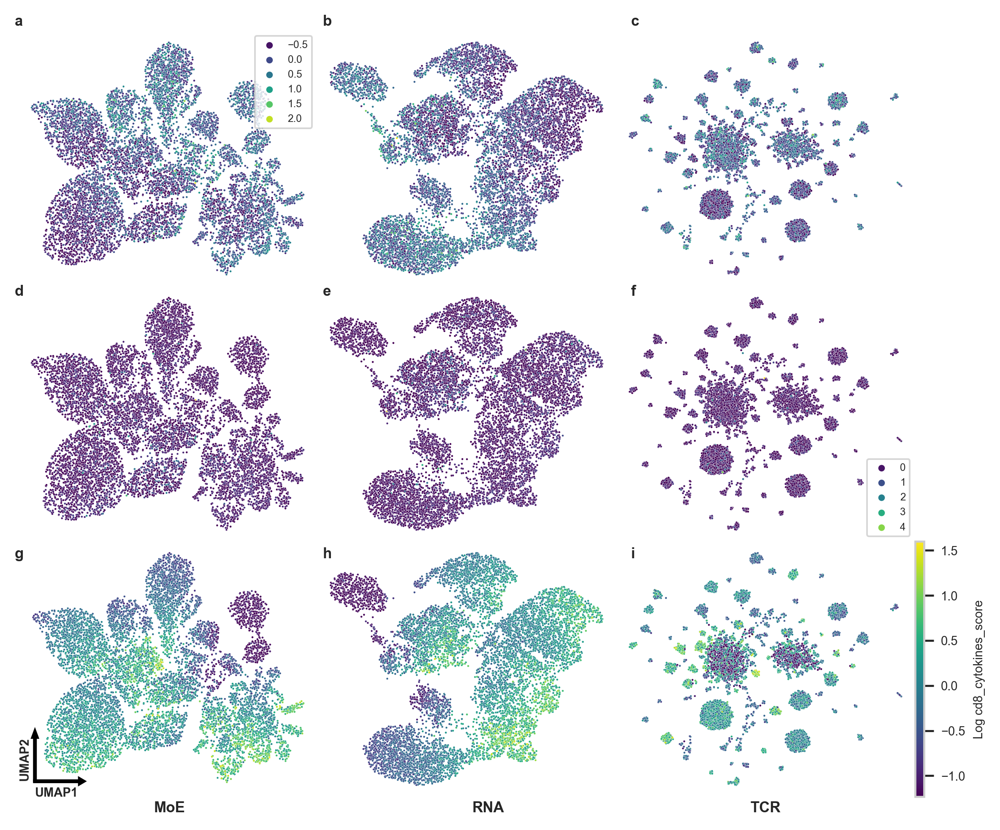

In [16]:
fig = plt.figure(figsize=(TEXT_WIDTH, TEXT_WIDTH * 0.8),
                 dpi=DPI)

gridspec = mpl.gridspec.GridSpec(
    figure=fig,
    nrows=3,
    ncols=4,
    height_ratios=[1, 1, 1],
    width_ratios=[1, 1, 1, 0.03],
    wspace=0.,
    hspace=0.,
)

ax_11 = fig.add_subplot(gridspec[0])
ax_12 = fig.add_subplot(gridspec[1])
ax_13 = fig.add_subplot(gridspec[2])
ax_14 = fig.add_subplot(gridspec[3])
ax_21 = fig.add_subplot(gridspec[4])
ax_22 = fig.add_subplot(gridspec[5])
ax_23 = fig.add_subplot(gridspec[6])
ax_24 = fig.add_subplot(gridspec[7])
ax_31 = fig.add_subplot(gridspec[8])
ax_32 = fig.add_subplot(gridspec[9])
ax_33 = fig.add_subplot(gridspec[10])
ax_34 = fig.add_subplot(gridspec[11])

plot_umap(ad_dual, 'cd8_differentiation_score', ax_11, legend=True)
plot_umap(ad_rna, 'cd8_differentiation_score', ax_12)
plot_umap(ad_tcr, 'cd8_differentiation_score', ax_13)
plot_empty(ax_14)

plot_umap(ad_dual, 'cd8_chemokines and sensing_score', ax_21)
plot_umap(ad_rna, 'cd8_chemokines and sensing_score', ax_22)
plot_umap(ad_tcr, 'cd8_chemokines and sensing_score', ax_23, legend=True)
#plot_colorbar(ad_dual, 'large_clonotypes', ax_24)
plot_empty(ax_24)

plot_umap(ad_dual, 'cd8_cytokines_score', ax_31)
plot_umap(ad_rna, 'cd8_cytokines_score', ax_32)
plot_umap(ad_tcr, 'cd8_cytokines_score', ax_33)
plot_colorbar(ad_dual, 'cd8_cytokines_score', ax_34)

fig.text(0.01, 0.99, 'a', size='large', weight='bold')
fig.text(0.32, 0.99, 'b', size='large', weight='bold')
fig.text(0.63, 0.99, 'c', size='large', weight='bold')
fig.text(0.01, 0.65, 'd', size='large', weight='bold')
fig.text(0.32, 0.65, 'e', size='large', weight='bold')
fig.text(0.63, 0.65, 'f', size='large', weight='bold')
fig.text(0.01, 0.32, 'g', size='large', weight='bold')
fig.text(0.32, 0.32, 'h', size='large', weight='bold')
fig.text(0.63, 0.32, 'i', size='large', weight='bold')

fig.text(0.15, 0., 'MoE', size='large', weight='bold')
fig.text(0.47, 0., 'RNA', size='large', weight='bold')
fig.text(0.75, 0., 'TCR', size='large', weight='bold')

plot_umap_axis(ax_31)

fig.tight_layout()
fig.savefig('figures/02_10x_umaps.pdf',
           dpi=DPI, bbox_inches='tight')
fig.savefig('figures/02_10x_umaps.png',
           dpi=DPI, bbox_inches='tight')